In [2]:
!pip install seaborn

  Using cached seaborn-0.12.2-py3-none-any.whl (293 kB)


In [1]:
# load a mat file with EEG data
# convert to a pandas dataframe


import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# load mat file
mat = scipy.io.loadmat('/Users/anastasia/Dropbox/sbj examples/allEEGdata.mat')


mat

{'__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Sun Jul  2 00:11:34 2023',
 '__version__': '1.0',
 '__globals__': [],
 'all_data': array([[[ 3.26633215e-04,  1.34609923e-04,  3.29615419e-03, ...,
          -2.14150766e-03, -1.73729218e-03, -1.00655895e-03],
         [-4.87355639e-03, -5.25067712e-03, -4.26357522e-03, ...,
           5.31817056e-04,  3.15903965e-05, -6.75391948e-04],
         [ 6.62639573e-04,  1.53677411e-04, -4.91865352e-04, ...,
          -1.83241593e-03, -1.84119663e-03, -1.77824728e-03]],
 
        [[            nan,             nan,             nan, ...,
          -1.45705081e-03, -1.49761747e-03, -1.84767177e-03],
         [            nan,             nan,             nan, ...,
           1.67831230e-03,  2.46302693e-03,  3.16718193e-03],
         [            nan,             nan,             nan, ...,
           8.31326855e-04,  9.95036315e-04,  1.20460289e-03]],
 
        [[            nan,             nan,             nan, ...,
          

In [2]:
mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'all_data'])

In [3]:
# extract the data from the dictionary
data = mat['all_data']

In [4]:
data.shape

(42, 3, 460800)

In [6]:
! pip install mne

In [7]:
# Use MNE-python to preprocess the EEG data: fill interpolate the missing values 


import mne


# Define an MNE Info object with the details of your experiment
info = mne.create_info(
    ch_names=['Fz-Cz','Cz-Oz','C4-M1'],  # replace with your channel names
    ch_types=['eeg', 'eeg', 'eeg'],  # replace with your channel types
    sfreq=256
)



In [8]:
# Loop over subjects to create a list of MNE Raw objects
raws = []
for i in range(data.shape[0]):
    raw = mne.io.RawArray(data[i], info)
    raws.append(raw)



Creating RawArray with float64 data, n_channels=3, n_times=460800
    Range : 0 ... 460799 =      0.000 ...  1799.996 secs
Ready.
Creating RawArray with float64 data, n_channels=3, n_times=460800
    Range : 0 ... 460799 =      0.000 ...  1799.996 secs
Ready.
Creating RawArray with float64 data, n_channels=3, n_times=460800
    Range : 0 ... 460799 =      0.000 ...  1799.996 secs
Ready.
Creating RawArray with float64 data, n_channels=3, n_times=460800
    Range : 0 ... 460799 =      0.000 ...  1799.996 secs
Ready.
Creating RawArray with float64 data, n_channels=3, n_times=460800
    Range : 0 ... 460799 =      0.000 ...  1799.996 secs
Ready.
Creating RawArray with float64 data, n_channels=3, n_times=460800
    Range : 0 ... 460799 =      0.000 ...  1799.996 secs
Ready.
Creating RawArray with float64 data, n_channels=3, n_times=460800
    Range : 0 ... 460799 =      0.000 ...  1799.996 secs
Ready.
Creating RawArray with float64 data, n_channels=3, n_times=460800
    Range : 0 ... 460799

In [9]:
raws[0]


<RawArray | 3 x 460800 (1800.0 s), ~10.6 MB, data loaded>

In [10]:
! pip install pyvista

In [157]:
! pip install pyvistaqt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.1/131.1 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 5.9 MB/s eta 0:00:00


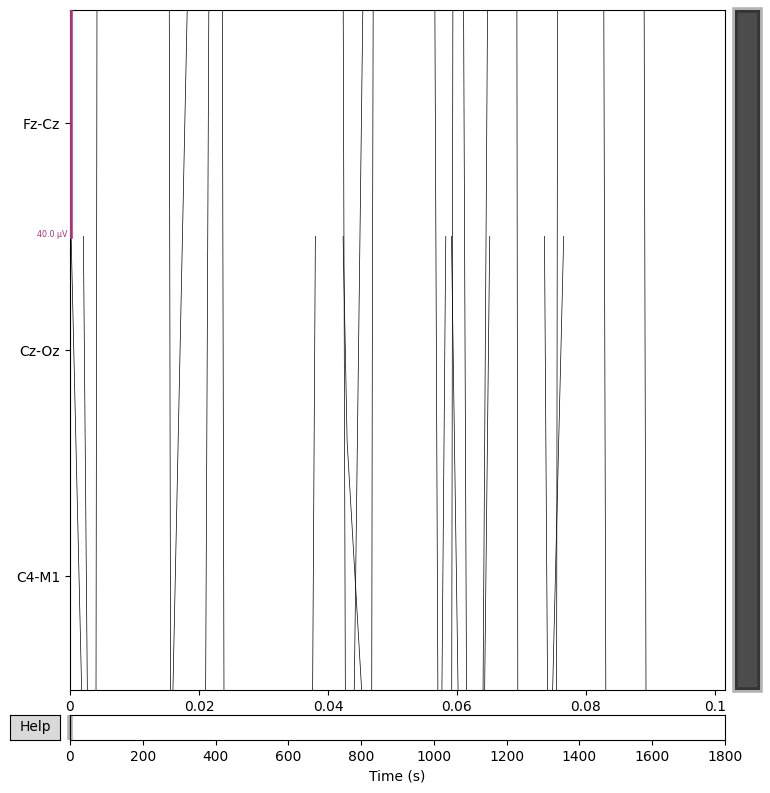

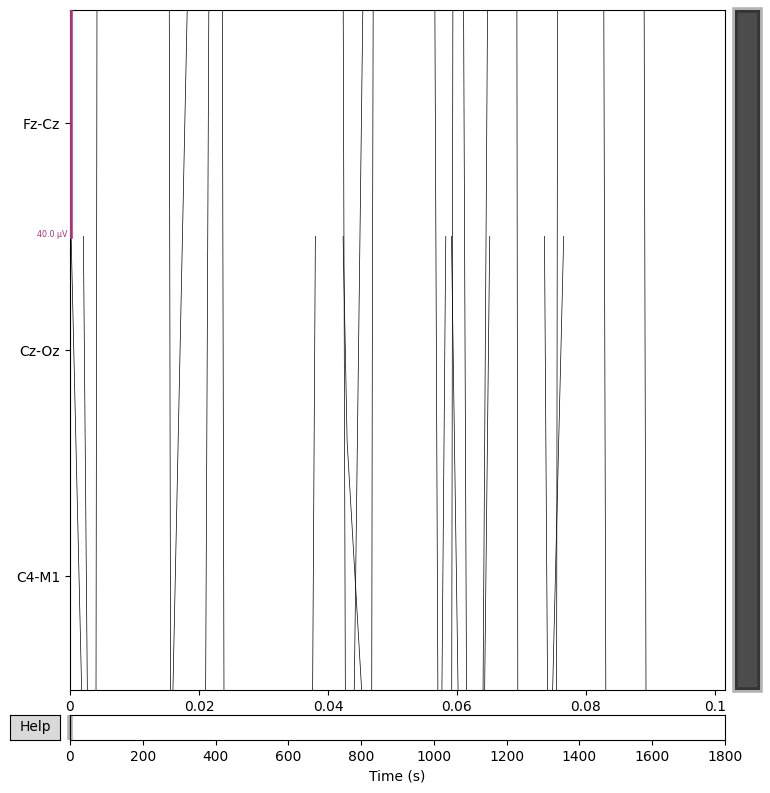

In [16]:
%matplotlib inline
raws[0].plot(duration=0.1, n_channels=3)


Effective window size : 8.000 (s)


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_38362/3584561437.py:4: RuntimeWarning: in version 1.5, the default behavior of Spectrum.plot() will change so that bad channels will be shown by default. To keep the old default behavior (and silence this warning), explicitly pass `picks='data', exclude='bads'`.
  raws[0].compute_psd().plot()
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_38362/3584561437.py:4: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raws[0].compute_psd().plot()
/Users/anastasia/Dropbox/Sleeper/sleep_onset_analysis/.conda/lib/python3.11/site-packages/mne/viz/utils.py:151: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_38362/3584561437.py:10: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  raws[0].interpolate_bads()

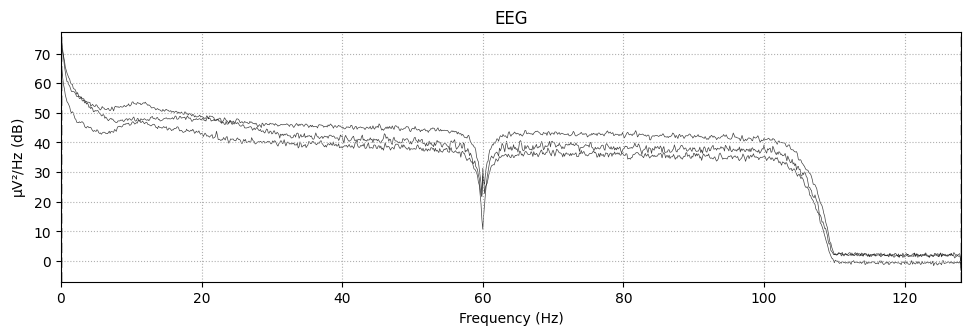

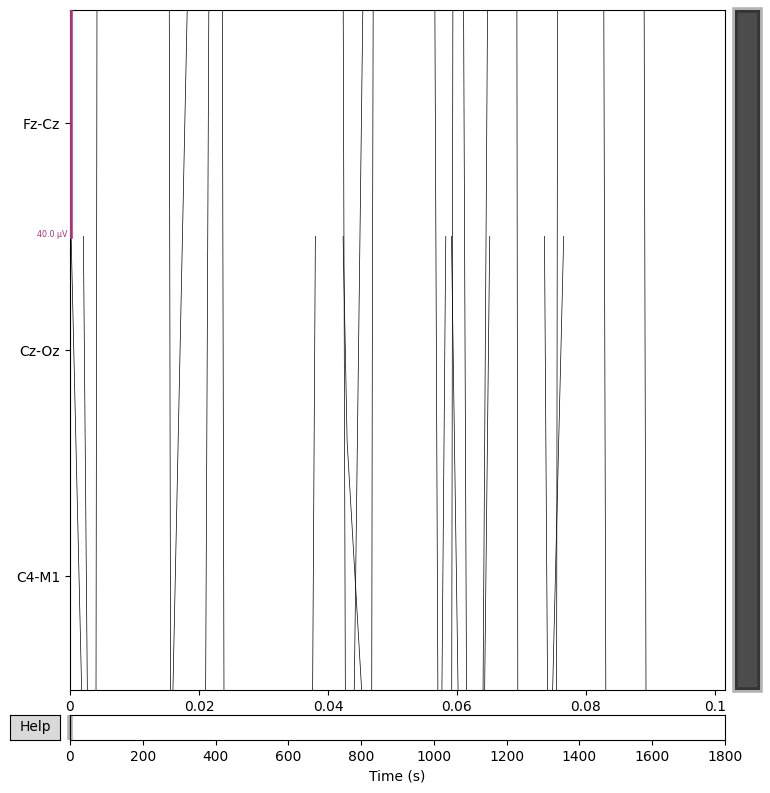

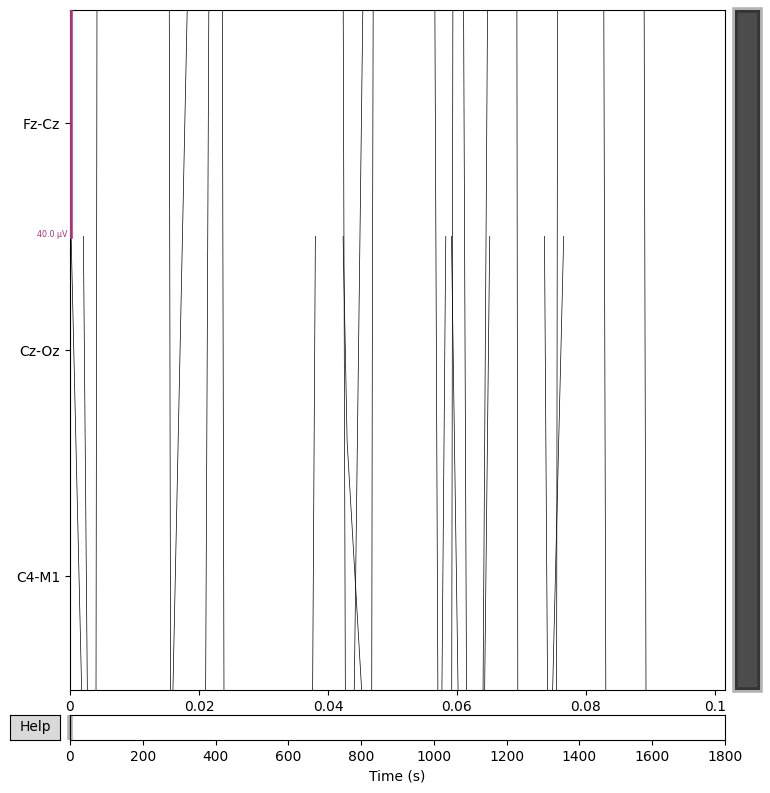

In [21]:
# Determine the bad channels and interpolate them

# Plot the power spectral density across channels
raws[0].compute_psd().plot()

# determine the bad channels
raws[0].bad_channels = ['Cz-Oz']

# interpolate the bad channels
raws[0].interpolate_bads()

# show the interpolated channels
raws[0].plot(duration=0.1, n_channels=3)





In [23]:
# Use MNE to get rid of the NaN values in the data


raws[0].info





<Info | 7 non-empty values
 bads: []
 ch_names: Fz-Cz, Cz-Oz, C4-M1
 chs: 3 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 128.0 Hz
 meas_date: unspecified
 nchan: 3
 projs: []
 sfreq: 256.0 Hz
>

## Try to mean the signal across 3 channels ##

In [25]:
# Take a mean of the data across the channels (axis=1) while omitting nans
data_mean = np.nanmean(data, axis=1)

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_38362/2830902469.py:2: RuntimeWarning: Mean of empty slice
  data_mean = np.nanmean(data, axis=1)


In [26]:
data_mean.shape

(42, 460800)

In [27]:
np.arange(0, 256*60*30, 256*10)

array([     0,   2560,   5120,   7680,  10240,  12800,  15360,  17920,
        20480,  23040,  25600,  28160,  30720,  33280,  35840,  38400,
        40960,  43520,  46080,  48640,  51200,  53760,  56320,  58880,
        61440,  64000,  66560,  69120,  71680,  74240,  76800,  79360,
        81920,  84480,  87040,  89600,  92160,  94720,  97280,  99840,
       102400, 104960, 107520, 110080, 112640, 115200, 117760, 120320,
       122880, 125440, 128000, 130560, 133120, 135680, 138240, 140800,
       143360, 145920, 148480, 151040, 153600, 156160, 158720, 161280,
       163840, 166400, 168960, 171520, 174080, 176640, 179200, 181760,
       184320, 186880, 189440, 192000, 194560, 197120, 199680, 202240,
       204800, 207360, 209920, 212480, 215040, 217600, 220160, 222720,
       225280, 227840, 230400, 232960, 235520, 238080, 240640, 243200,
       245760, 248320, 250880, 253440, 256000, 258560, 261120, 263680,
       266240, 268800, 271360, 273920, 276480, 279040, 281600, 284160,
      

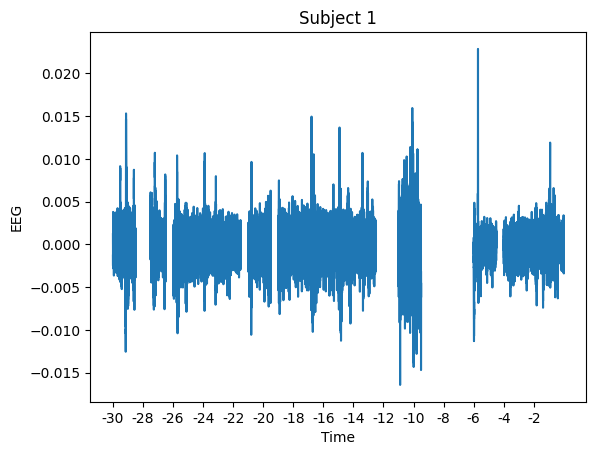

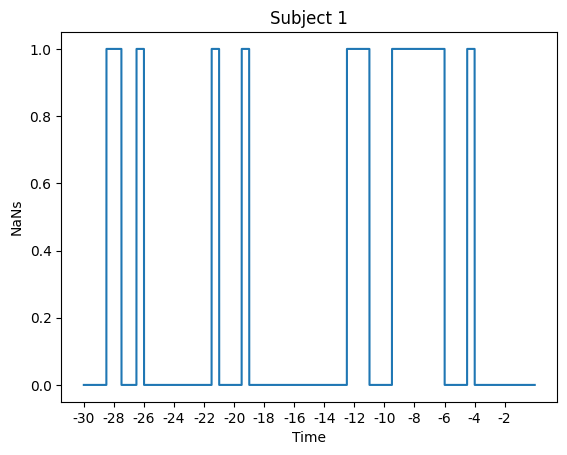

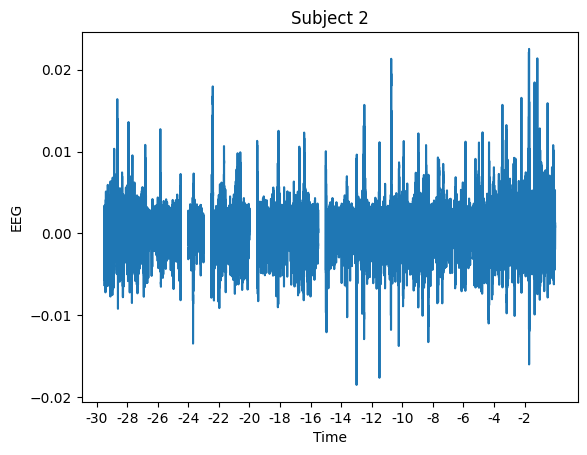

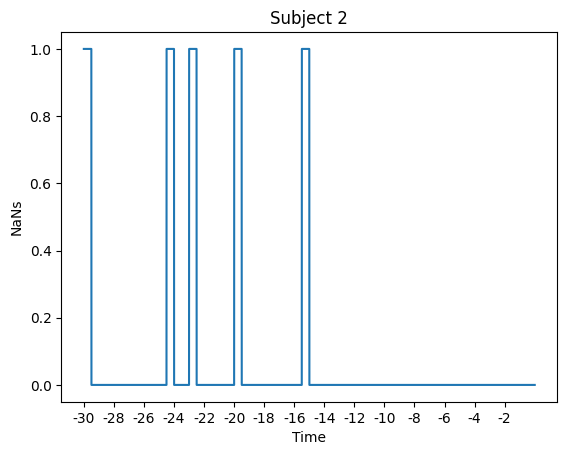

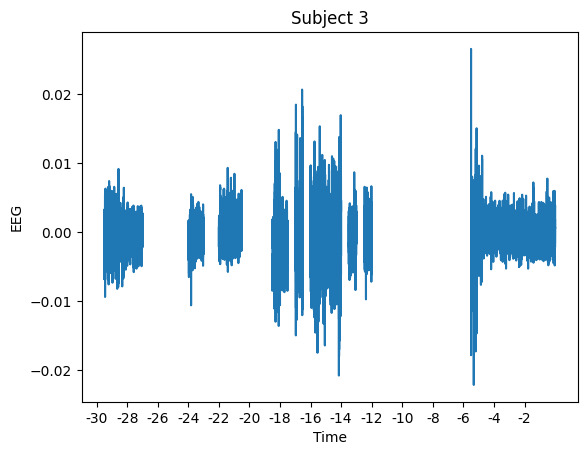

...

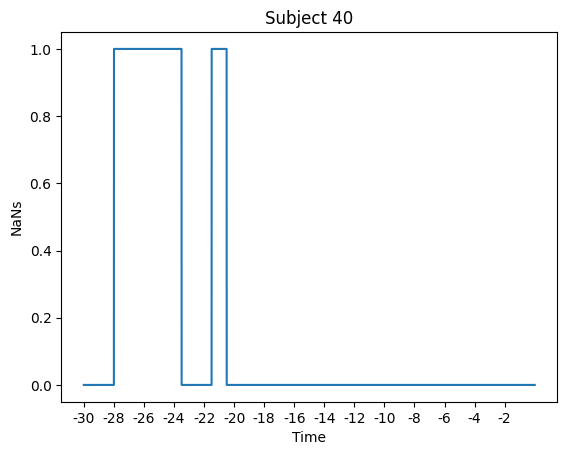

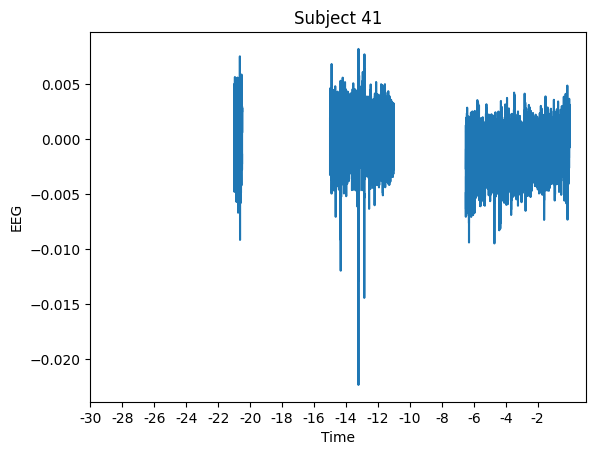

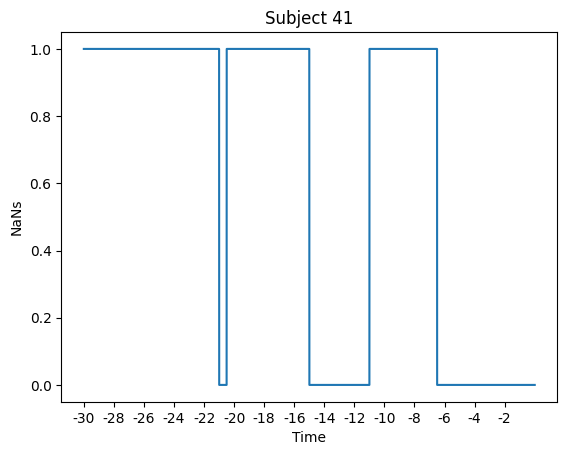

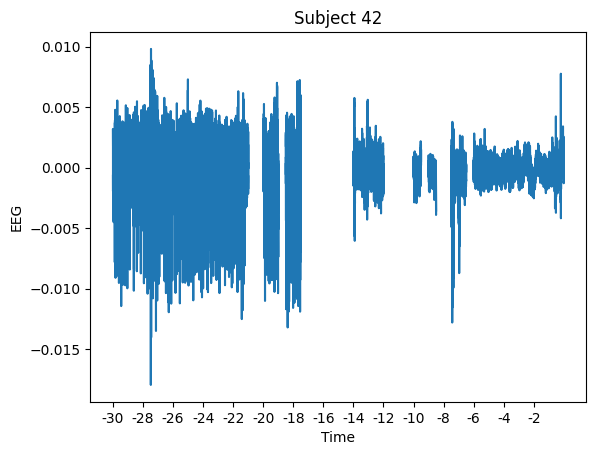

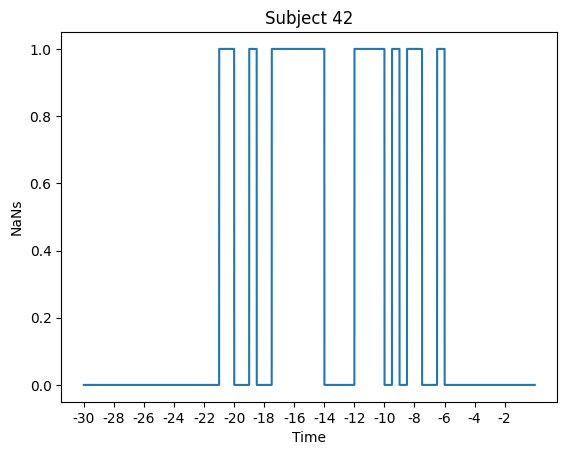

In [28]:
#For each subject plot the EEG data and show where there are NaNs

# x axis is time (256 Hz sampling rate)

for i in range(0, data_mean.shape[0]):

    plt.figure()
    plt.plot(data_mean[i, :])
    plt.xticks(np.arange(0, 256*60*30, 256*120), np.arange(-30, 0, 2))
    plt.title('Subject ' + str(i+1))
    plt.xlabel('Time')
    plt.ylabel('EEG')
    plt.show()

    # plot the NaNs
    plt.figure()
    plt.plot(np.isnan(data_mean[i, :]))
    plt.xticks(np.arange(0, 256*60*30, 256*120), np.arange(-30, 0, 2))
    plt.title('Subject ' + str(i+1))
    plt.xlabel('Time')
    plt.ylabel('NaNs')
    plt.show()



In [105]:
# Create a class to store the windowed data and labels for each subject

class SbjEEG:

    def __init__(self, alldata, Fs, sbj_id):
        self.alldata = alldata
        self.Fs = Fs
        self.recording_duration = (alldata.shape[1] / Fs)/60
        self.mean_data = None
        self.epoched_data = None
        self.labels = None
        self.window_size = None 
        self.window_step = None 
        self.num_windows = None
        self.epoched_data_mean = None 
        self.labels_mean = None
        self.window_size_mean = None 
        self.window_step_mean = None 
        self.num_windows_mean = None 
        self.num_channels = alldata.shape[0]
        self.sbj_id = sbj_id
        
    def __repr__(self):
        return 'SbjEEG(alldata = {}, epoched_data={}, labels={})'.format(self.alldata, self.epoched_data, self.labels)
    
    def __str__(self):
        return 'SbjEEG(alldata = {}, epoched_data={}, labels={})'.format(self.alldata, self.epoched_data, self.labels)
    
    def __getitem__(self, index):
        return SbjEEG(self.epoched_data[index], self.labels[index])
    
    def __len__(self):
        return len(self.alldata)
    
    def __add__(self, other):
        return SbjEEG(np.concatenate((self.epoched_data, other.epoched_data)), np.concatenate((self.labels, other.labels)))
    
    def __radd__(self, other):

        if other == 0:
            return self
        else:
            return self.__add__(other)
        
    def __iadd__(self, other):

        self.data = np.concatenate((self.epoched_data, other.epoched_data))
        self.labels = np.concatenate((self.labels, other.labels))
        
        return self
    
    def average_data(self):
        self.mean_data = np.nanmean(self.alldata, axis=0)
        return self.mean_data
    
    def plot_data(self):
        for ch in range(0, self.num_channels):
            plt.figure()
            plt.plot(self.alldata[ch, :])
            plt.xticks(np.arange(0, 256*60*self.recording_duration, 256*300), np.arange(-self.recording_duration, 0, 5))
            plt.title('Subject ' + str(self.sbj_id+1) + ' Channel ' + str(ch))
            
            plt.xlabel('Time')
            plt.ylabel('EEG')
            plt.show()

            # plot the NaNs
            plt.figure()
            plt.plot(np.isnan(self.alldata[ch, :]))
            plt.xticks(np.arange(0, 256*60*self.recording_duration, 256*300), np.arange(-self.recording_duration, 0, 5))
            plt.title('Subject ' + str(self.sbj_id+1) + ' Channel ' + str(ch))
            plt.xlabel('Time')


    
    def plot_mean_data(self):
        if self.mean_data is None:
            self.average_data()
        plt.figure()
        plt.plot(self.mean_data)
        ticks =  np.arange(-self.recording_duration, 0, 5)
        #turn into 1 decimal place
        ticks = np.round(ticks, 1)

        plt.xticks(np.arange(0, 256*60*self.recording_duration, 256*300),ticks)
        plt.title('Subject ' + str(self.sbj_id+1))
        plt.xlabel('Time')
        plt.ylabel('EEG')
        plt.show()

        plt.figure()
        plt.plot(np.isnan(self.mean_data))
        plt.xticks(np.arange(0, 256*60*self.recording_duration, 256*300),ticks)
        plt.title('Subject ' + str(self.sbj_id+1))
        plt.xlabel('Time')
        plt.ylabel('NaNs')
        plt.show()

    def plot_external_data(self, data):
        
        data_duration = (data.shape[0] / self.Fs)/60
        ticks = np.arange(-data_duration, 0, data_duration/5)
        ticks = np.round(ticks, 1)
        plt.figure()
        plt.plot(data)
        plt.xticks(np.arange(0, 256*60*data_duration, 256*data_duration*60/5), ticks)
        plt.title('Subject ' + str(self.sbj_id+1))
        plt.xlabel('Time')
        plt.ylabel('EEG')
        plt.show()

        plt.figure()
        plt.plot(np.isnan(data))
        plt.xticks(np.arange(0, 256*60*data_duration, 256*data_duration*60/5), ticks)
        plt.title('Subject ' + str(self.sbj_id+1))
        plt.xlabel('Time')
        plt.ylabel('NaNs')
        plt.show()

        
        
        

    def create_sliding_windows_mean(self, window_size, stride):
        self.window_size_mean = window_size*256
        self.window_step_mean = stride*256
        self.num_windows_mean = int((self.mean_data.shape[0] - self.window_size_mean) / stride) + 1
        self.epoched_data_mean = np.zeros((self.num_windows_mean, self.window_size_mean))
        self.labels_mean = np.zeros(self.num_windows_mean)
        num_datapoints = self.mean_data.shape[0]
        end = self.window_size_mean
        idx_to_delete = []
        for i in range(self.num_windows_mean):

            start = i * stride
            end = start + self.window_size_mean
            window =  self.mean_data[start:end]
            
            if np.isnan(window).any():
                idx_to_delete.append(i)
                self.labels_mean[i] = np.nan
                window = np.zeros(self.window_size_mean)
                continue
            else:
                self.epoched_data_mean[i, :] = window
                self.labels_mean[i] = (num_datapoints - end) / (60 * 256)

        self.epoched_data_mean = np.delete(self.epoched_data_mean, idx_to_delete, axis=0)
        self.labels_mean = np.delete(self.labels_mean, idx_to_delete, axis=0)
        self.num_windows_mean = self.epoched_data_mean.shape[0]
        return self.epoched_data_mean, self.labels_mean

    
    def create_sliding_windows(self, window_size, stride):
        self.window_size = window_size*256
        self.window_step = stride*256
        self.num_windows = int((self.alldata.shape[1] - self.window_size) / stride) + 1
        self.epoched_data = np.zeros((self.num_windows, self.num_channels, self.window_size))
        self.labels = np.zeros(self.num_windows)
        num_datapoints = self.alldata.shape[1]
        end = self.window_size
        idx_to_delete = []
        for i in range(self.num_windows):
            start = i * stride
            end = start + self.window_size
            window =  self.alldata[:, start:end]
            if np.isnan(window).any():
                idx_to_delete.append(i)
                self.labels[i] = np.nan
                window = np.zeros((self.num_channels, self.window_size))
                continue
            else:
                self.epoched_data[i, :, :] = window
                self.labels[i] = (num_datapoints - end) / (60 * 256)
        
        self.epoched_data = np.delete(self.epoched_data, idx_to_delete, axis=0)
        self.labels = np.delete(self.labels, idx_to_delete, axis=0)
        self.num_windows = self.epoched_data.shape[0]

        return self.epoched_data, self.labels
    
    def extract_last_minutes(self, minutes):
        last_minutes = self.alldata[:, -minutes*60*256:]
        

        # check if there are any NaNs in the data
        if np.isnan(last_minutes).any():
            ifnanispresent = True
        else:
            ifnanispresent = False

        return last_minutes, ifnanispresent
    
    def extract_last_minutes_mean(self, minutes):
        mean_last_minutes = self.mean_data[-minutes*60*256:]
        

        # check if there are any NaNs in the data
        if np.isnan(mean_last_minutes).any():
            ifnanispresent = True
        else:
            ifnanispresent = False

        return mean_last_minutes, ifnanispresent
    

        



In [106]:


# Create a list of SbjEEG objects, one for each subject
sbj_eegs = [SbjEEG(data[i], 256, i) for i in range(len(data))]
sbj_eegs

[SbjEEG(alldata = [[ 3.26633215e-04  1.34609923e-04  3.29615419e-03 ... -2.14150766e-03
   -1.73729218e-03 -1.00655895e-03]
  [-4.87355639e-03 -5.25067712e-03 -4.26357522e-03 ...  5.31817056e-04
    3.15903965e-05 -6.75391948e-04]
  [ 6.62639573e-04  1.53677411e-04 -4.91865352e-04 ... -1.83241593e-03
   -1.84119663e-03 -1.77824728e-03]], epoched_data=None, labels=None),
 SbjEEG(alldata = [[        nan         nan         nan ... -0.00145705 -0.00149762
   -0.00184767]
  [        nan         nan         nan ...  0.00167831  0.00246303
    0.00316718]
  [        nan         nan         nan ...  0.00083133  0.00099504
    0.0012046 ]], epoched_data=None, labels=None),
 SbjEEG(alldata = [[        nan         nan         nan ...  0.00072911  0.00140904
    0.00188986]
  [        nan         nan         nan ... -0.00155362 -0.00112534
   -0.00066216]
  [        nan         nan         nan ...  0.00252821  0.00385372
    0.00398471]], epoched_data=None, labels=None),
 SbjEEG(alldata = [[-3.49

In [107]:
# average the data for each subject
for sbj in sbj_eegs:
    sbj.average_data()

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_99466/2763090061.py:53: RuntimeWarning: Mean of empty slice
  self.mean_data = np.nanmean(self.alldata, axis=0)


In [108]:
# Extract the last 2 minutes of data from each subject
last_2_minutes = [sbj_eegs[i].extract_last_minutes_mean(2)[0] for i in range(len(sbj_eegs))]
ifnanispresent = [sbj_eegs[i].extract_last_minutes_mean(2)[1] for i in range(len(sbj_eegs))]

last_2_minutes[0].shape
    


(30720,)

In [109]:
data_duration = (last_2_minutes[0].shape[0] / 256)/60
data_duration
np.arange(-data_duration, 0, data_duration/5)


array([-2. , -1.6, -1.2, -0.8, -0.4])

In [110]:
np.arange(0, 256*60*data_duration, 256*data_duration*60/5)

array([    0.,  6144., 12288., 18432., 24576.])

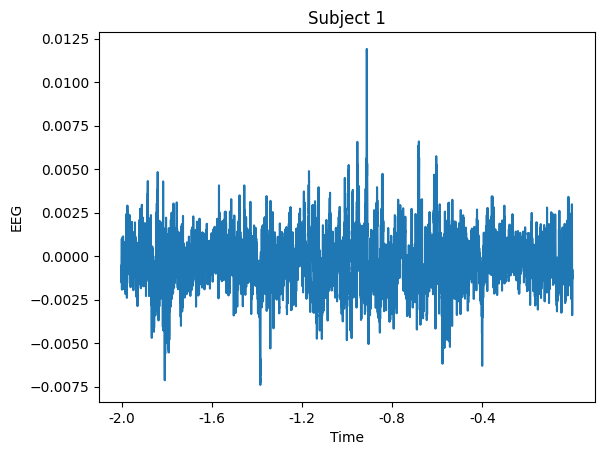

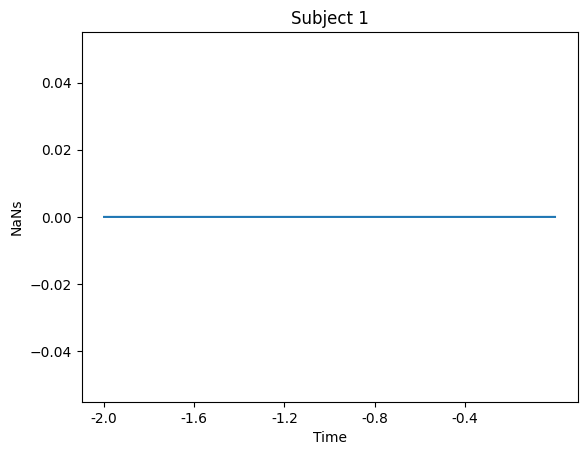

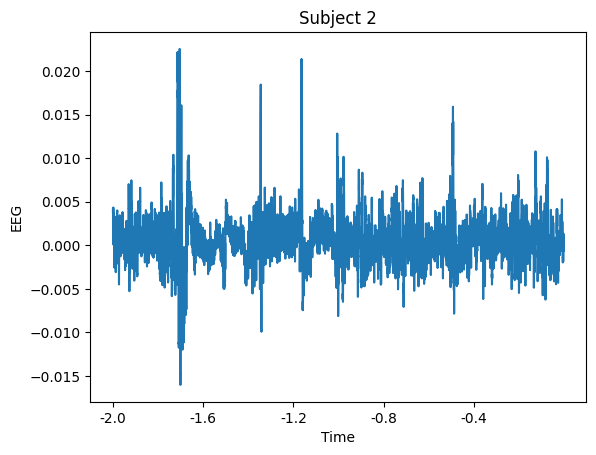

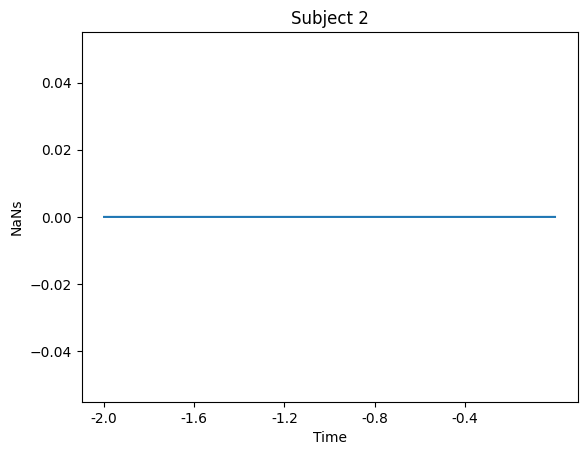

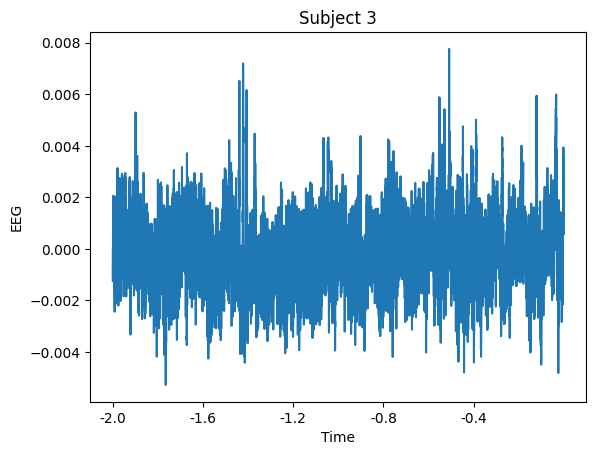

...

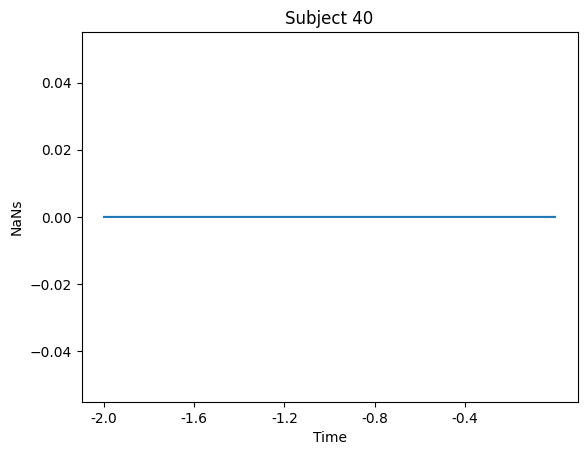

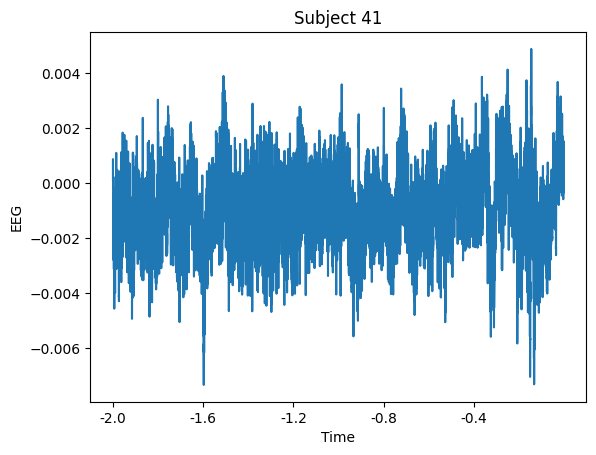

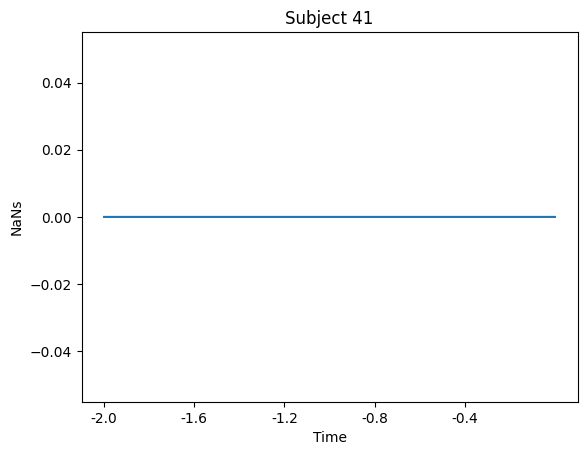

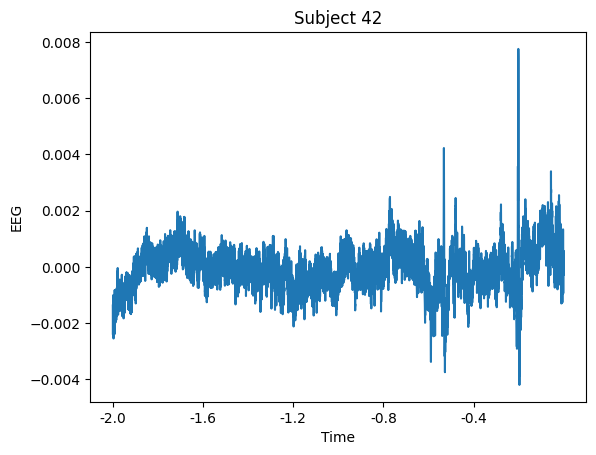

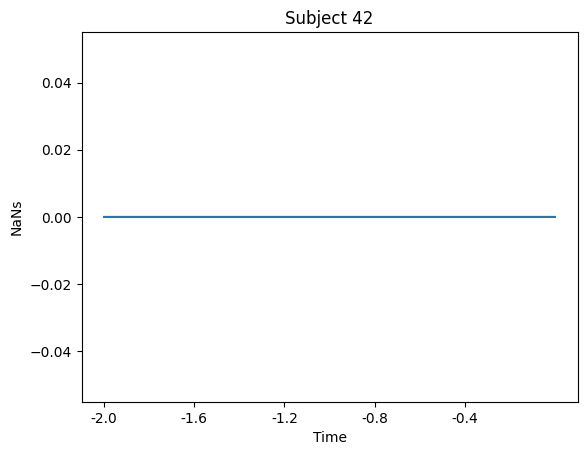

In [111]:
# Plot the data for each subject
for i in range(len(sbj_eegs)):
    sbj_eegs[i].plot_external_data(last_2_minutes[i])

In [113]:
ifnanispresent

[False,
 False,
 False,
 True,
 False,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 True,
 True,
 False,
 False,
 True,
 False,
 True,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 True,
 False,
 False,
 False,
 False,
 False]

In [112]:
# Only pick the subjects that have no NaNs in the data
last_2_minutes_no_nan = [last_2_minutes[i] for i in range(len(last_2_minutes)) if ifnanispresent[i] == False]
last_2_minutes_no_nan = np.array(last_2_minutes_no_nan)


In [114]:
last_2_minutes_no_nan.shape

(31, 30720)

In [117]:
import torch

In [135]:
# Put the last_2_minutes_no_nan in the right format for VAE training in PyTorch
# create a list of subjects in the dataset
subjects = [i for i in range(last_2_minutes_no_nan.shape[0])]

# Create a dataset, where each subject is a sample

dataset = torch.utils.data.TensorDataset(torch.from_numpy(last_2_minutes_no_nan).float(), torch.from_numpy(np.array(subjects)).float())
 
# Create a dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=2, shuffle=True)




In [140]:
import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.autograd import Variable



class LSTM_VAE(nn.Module):
    def __init__(self, feature_dim, hidden_dim, num_layers, latent_dim, sequence_length):
        super(LSTM_VAE, self).__init__()

        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim
        self.relu = nn.LeakyReLU()
        self.sequence_length = sequence_length

        # encoder: LSTM layer and a linear layer
        self.lstm1 = nn.LSTM(feature_dim, hidden_dim, num_layers=num_layers, batch_first=True)
        self.fc1 = nn.Linear(hidden_dim, latent_dim)
        self.fc2 = nn.Linear(hidden_dim, latent_dim)

        # decoder: linear layer and LSTM layer
        self.fc3 = nn.Linear(latent_dim, hidden_dim)
        self.lstm2 = nn.LSTM(hidden_dim, feature_dim, num_layers=num_layers, batch_first=True)

        # Xavier/Glorot initialization
        for name, param in self.named_parameters():
            if 'weight' in name:
                nn.init.xavier_normal_(param)
            elif 'bias' in name:
                nn.init.constant_(param, 0)

    def encode(self, x):
        _, (h_n, _) = self.lstm1(x)
        h_n = self.relu(h_n[-1])  # take the last hidden state
        return self.fc1(h_n), self.fc2(h_n)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std

    def decode(self, z):
        z = self.relu(self.fc3(z))
        z = z.unsqueeze(1).repeat(1, self.sequence_length, 1)  # repeat along sequence
        out, _ = self.lstm2(z)
        return out

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

# loss function
def loss_function(recon_x, x, mu, logvar):
    BCE = F.mse_loss(recon_x, x, reduction='sum')  # use mean squared error loss
    KLD = -0.8 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return BCE + KLD, BCE, KLD

torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([1, 30720])
Epoch 0, Loss: 330.27499574230563
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([1, 30720])
Epoch 1, Loss: 44.30422843271686
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2, 30720])
torch.Size([2

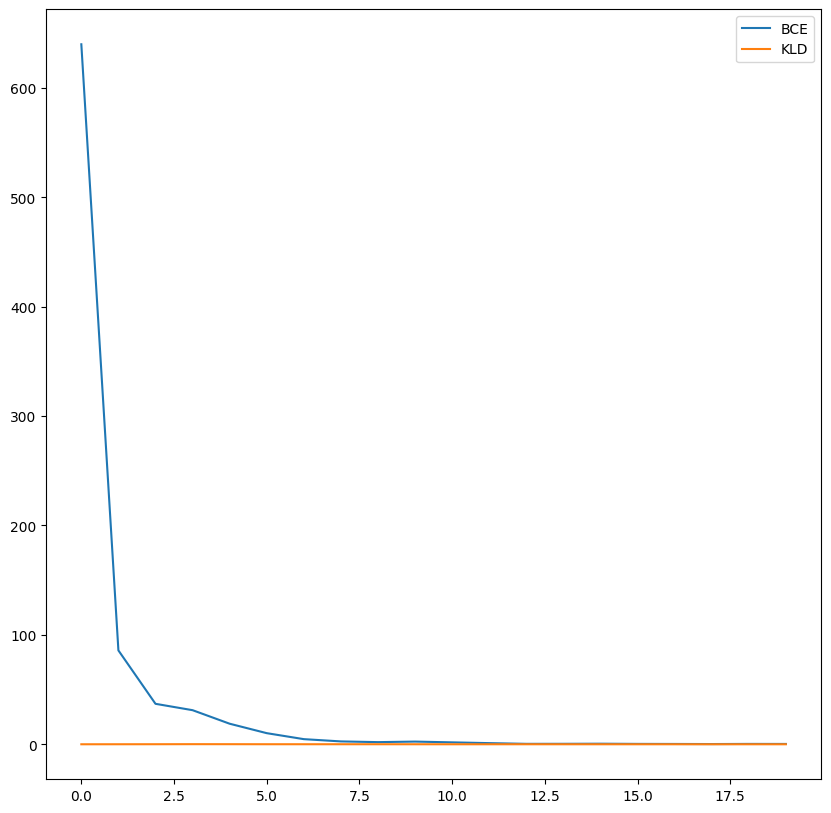

In [141]:
# Initialize the model and the optimizer

# dimensions
sequence_length = 30720
feature_dim = 1  # as you have 68 features
hidden_dim = 256  # adjust this
latent_dim = 20  # this will be the size of your lower-dimensional representation
num_layers = 2

model = LSTM_VAE(hidden_dim=hidden_dim, latent_dim=latent_dim, feature_dim=feature_dim, num_layers=num_layers, sequence_length=sequence_length)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)
model.train()

epochs = 20
bce_epochs = []
kld_epochs = []
for epoch in range(epochs):
    train_loss = 0
    bce_array = []
    kld_array = []
    for batch_idx, (data, labels) in enumerate(dataloader):
        print(data.shape) 
        # Add a dimension for the feature dimension
        data = data.unsqueeze(2)
        #data = data.permute(1, 0, 2)  # rearrange dimensions to [sequence_length, batch_size, feature_dim]
       #data = data.permute(1, 0, 2)  # rearrange dimensions to [sequence_length, batch_size, feature_dim]
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss, bce, kld = loss_function(recon_batch, data, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        # apply gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
        optimizer.step()
        bce_array.append(bce.detach().numpy())
        kld_array.append(kld.detach().numpy())
    bce_epochs.append(np.mean(bce_array))
    kld_epochs.append(np.mean(kld_array))
    print(f"Epoch {epoch}, Loss: {train_loss / len(dataloader.dataset)}")

# plot the loss
plt.figure(figsize=(10, 10))
plt.plot(bce_epochs, label='BCE')
plt.plot(kld_epochs, label='KLD')
plt.legend()

torch.Size([2, 30720])
(2, 30720, 1)


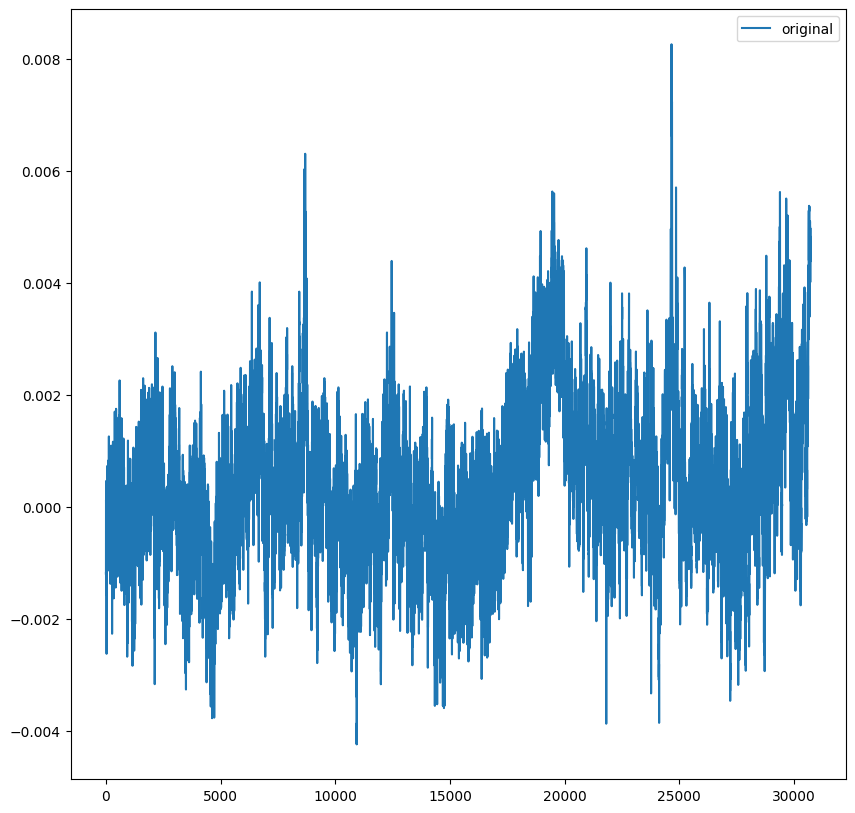

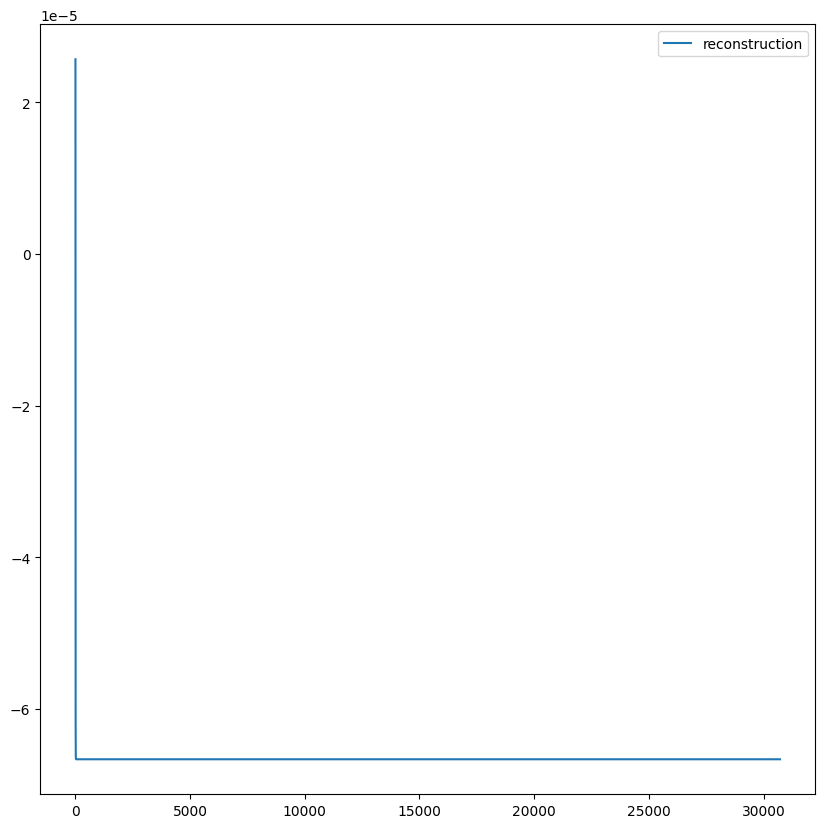

In [150]:
# Show the reconstruction of the test data
model.eval()
with torch.no_grad():
    for batch_idx, (data, labels) in enumerate(dataloader):
        print(data.shape)
        data = data.unsqueeze(2)
        recon_batch, mu, logvar = model(data)
        recon_batch = recon_batch.detach().numpy()
        print(recon_batch.shape)
        data = data.detach().numpy()
        break

# plot the reconstruction of the test data
plt.figure(figsize=(10, 10))
plt.plot(data[0, :], label='original')
plt.legend()
plt.show()

plt.figure(figsize=(10, 10))
plt.plot(recon_batch[0, :, 0], label='reconstruction')
plt.legend()
plt.show()


In [149]:
recon_batch[0, :, 0]

array([0.00039801, 0.00068803, 0.00088842, ..., 0.0013192 , 0.0013192 ,
       0.0013192 ], dtype=float32)

In [ ]:
# plot latent representation using t-SNE
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
latent_tsne = tsne.fit_transform(latent)
plt.figure(figsize=(10, 10))
# each dot should have a annotation showing the subject id (not colorcoded but labeled)
plt.scatter(latent_tsne[:, 0], latent_tsne[:, 1], c=sbj_ids, cmap='tab10')
for i, txt in enumerate(sbj_ids):
    plt.annotate(txt, (latent_tsne[i, 0], latent_tsne[i, 1]))



plt.show()

## Do sliding window RNN learning ##

In [6]:

for sbj in sbj_eegs:
    sbj.average_data()
    sbj.create_sliding_windows(5, 2)
    sbj.create_sliding_windows_mean(5, 2)


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_98642/2769385770.py:53: RuntimeWarning: Mean of empty slice
  self.mean_data = np.nanmean(self.alldata, axis=0)


: 

: 

In [85]:
# Show how many windows and windows means wihtout nans were created for each subject

for i, sbj in enumerate(sbj_eegs):
    print('Subject ' + str(i+1) + ' has ' + str(sbj.num_windows) + ' for 3 channels and ' + str(sbj.num_windows_mean) + ' mean windows')

Subject 1 has 168944 for 3 channels and 168944 mean windows
Subject 2 has 211190 for 3 channels and 211190 mean windows
Subject 3 has 115182 for 3 channels and 115182 mean windows
Subject 4 has 122856 for 3 channels and 122856 mean windows
Subject 5 has 230398 for 3 channels and 230398 mean windows
Subject 6 has 184306 for 3 channels and 184306 mean windows
Subject 7 has 126700 for 3 channels and 126700 mean windows
Subject 8 has 142064 for 3 channels and 142064 mean windows
Subject 9 has 145900 for 3 channels and 145900 mean windows
Subject 10 has 57582 for 3 channels and 57582 mean windows
Subject 11 has 122864 for 3 channels and 122864 mean windows
Subject 12 has 149744 for 3 channels and 149744 mean windows
Subject 13 has 76790 for 3 channels and 76790 mean windows
Subject 14 has 84458 for 3 channels and 84458 mean windows
Subject 15 has 138214 for 3 channels and 138214 mean windows
Subject 16 has 157424 for 3 channels and 157424 mean windows
Subject 17 has 142048 for 3 channels an

In [86]:
# Check whether the windows don't have any NaNs
for i, sbj in enumerate(sbj_eegs):
    print('Subject ' + str(i+1) + ' has NaNs in the windows: ' + str(np.isnan(sbj.epoched_data).any()))
    print('Subject ' + str(i+1) + ' has NaNs in the mean windows: ' + str(np.isnan(sbj.epoched_data_mean).any()))
    print('------------------------------------------------------------------------------------------------')

Subject 1 has NaNs in the windows: False
Subject 1 has NaNs in the mean windows: False
------------------------------------------------------------------------------------------------
Subject 2 has NaNs in the windows: False
Subject 2 has NaNs in the mean windows: False
------------------------------------------------------------------------------------------------
Subject 3 has NaNs in the windows: False
Subject 3 has NaNs in the mean windows: False
------------------------------------------------------------------------------------------------
Subject 4 has NaNs in the windows: False
Subject 4 has NaNs in the mean windows: False
------------------------------------------------------------------------------------------------
Subject 5 has NaNs in the windows: False
Subject 5 has NaNs in the mean windows: False
------------------------------------------------------------------------------------------------
Subject 6 has NaNs in the windows: False
Subject 6 has NaNs in the mean windows:

In [87]:
# look at the size of the windows
for i, sbj in enumerate(sbj_eegs):
    print('Subject ' + str(i+1) + ' has windows of size: ' + str(sbj.epoched_data.shape))
    print('Subject ' + str(i+1) + ' has mean windows of size: ' + str(sbj.epoched_data_mean.shape))
    print('------------------------------------------------------------------------------------------------')

Subject 1 has windows of size: (168944, 3, 5)
Subject 1 has mean windows of size: (168944, 5)
------------------------------------------------------------------------------------------------
Subject 2 has windows of size: (211190, 3, 5)
Subject 2 has mean windows of size: (211190, 5)
------------------------------------------------------------------------------------------------
Subject 3 has windows of size: (115182, 3, 5)
Subject 3 has mean windows of size: (115182, 5)
------------------------------------------------------------------------------------------------
Subject 4 has windows of size: (122856, 3, 5)
Subject 4 has mean windows of size: (122856, 5)
------------------------------------------------------------------------------------------------
Subject 5 has windows of size: (230398, 3, 5)
Subject 5 has mean windows of size: (230398, 5)
------------------------------------------------------------------------------------------------
Subject 6 has windows of size: (184306, 3, 5)

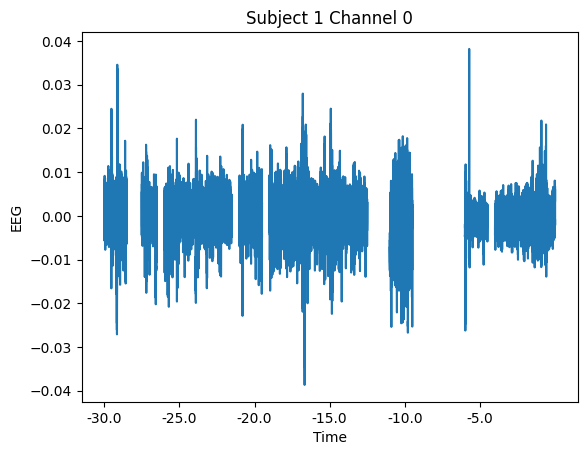

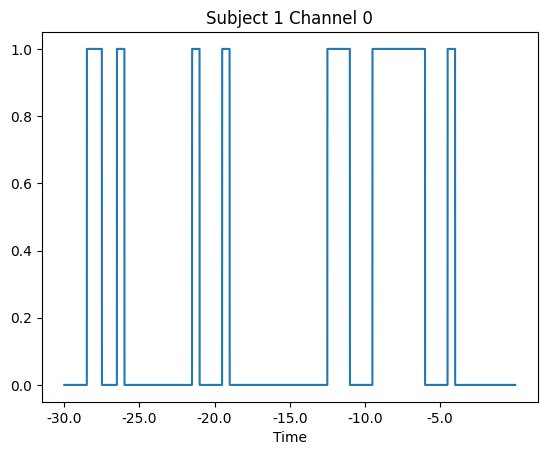

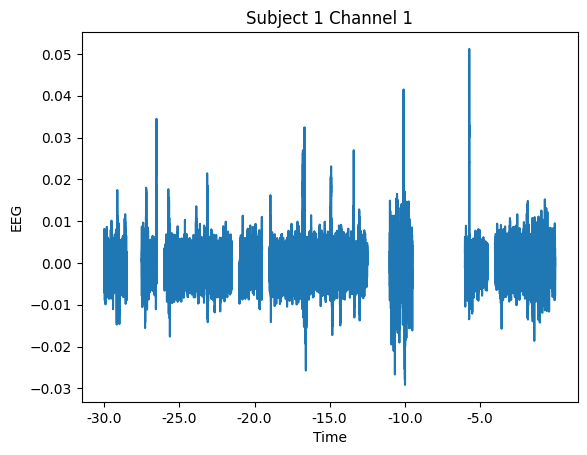

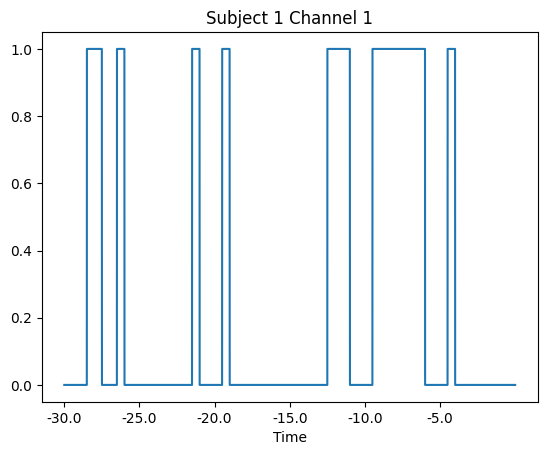

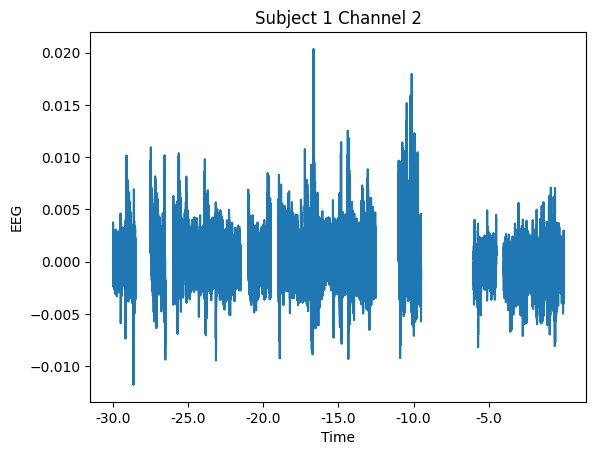

...

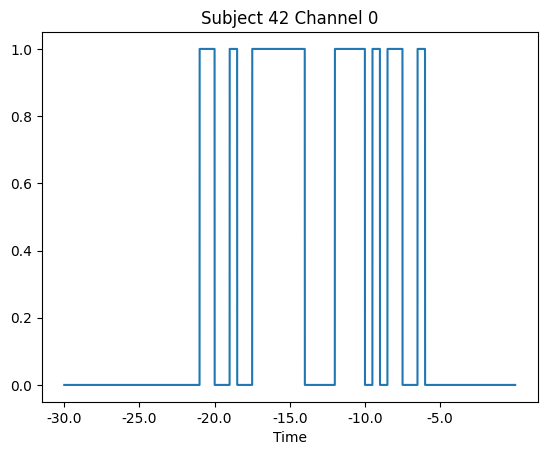

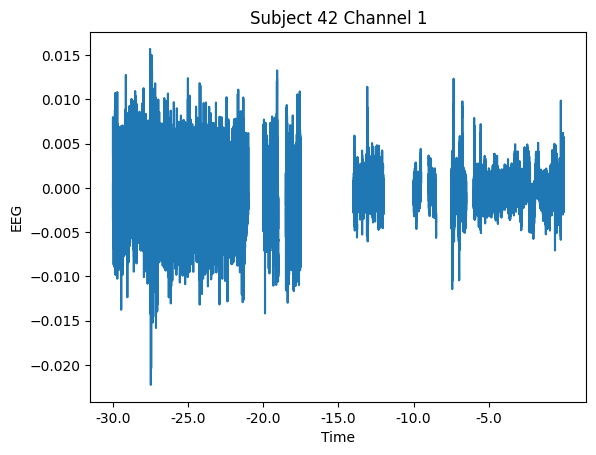

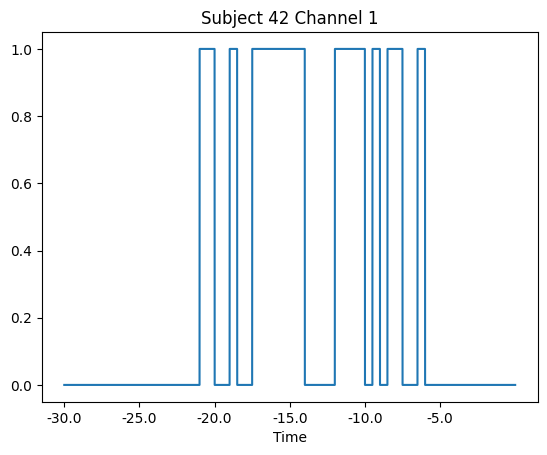

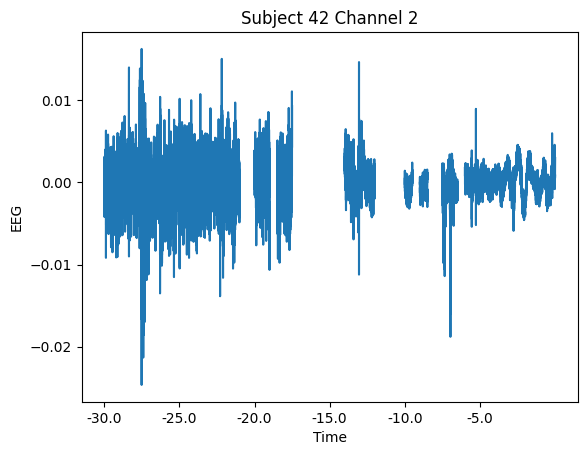

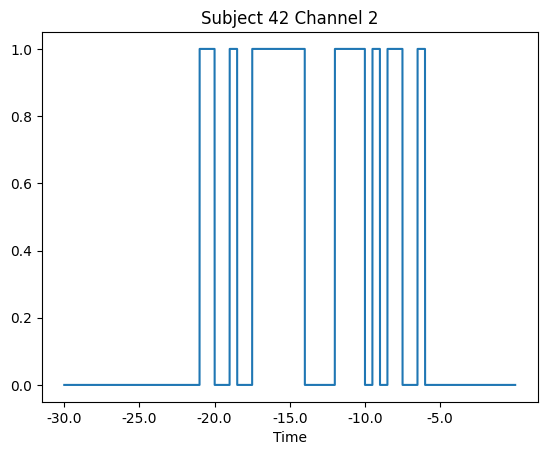

In [28]:
# Plot the data for each subject
for sbj in sbj_eegs:
    sbj.plot_data()

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_47361/838064058.py:48: RuntimeWarning: Mean of empty slice
  self.mean_data = np.nanmean(self.alldata, axis=0)


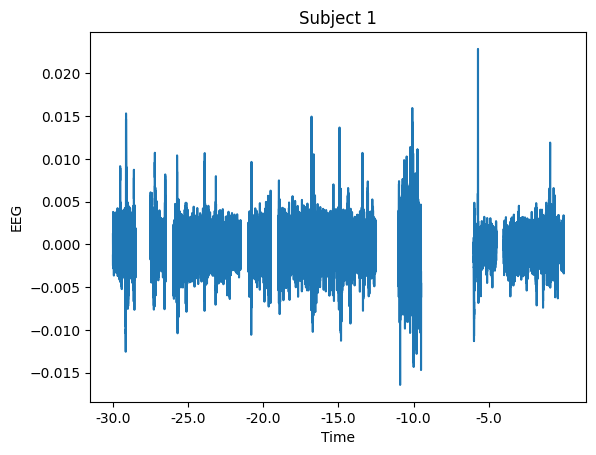

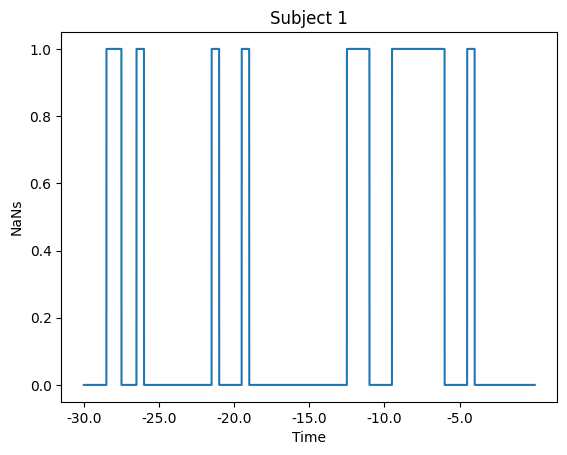

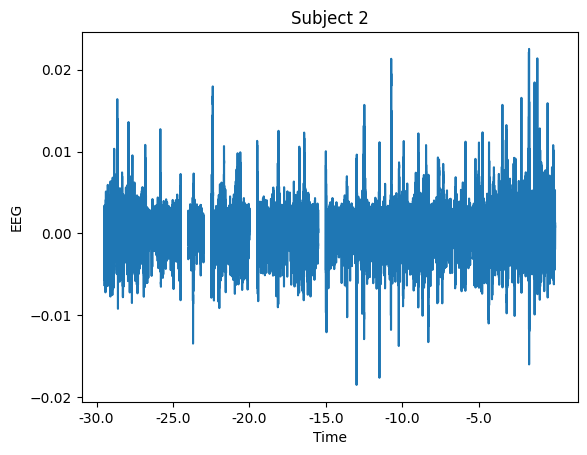

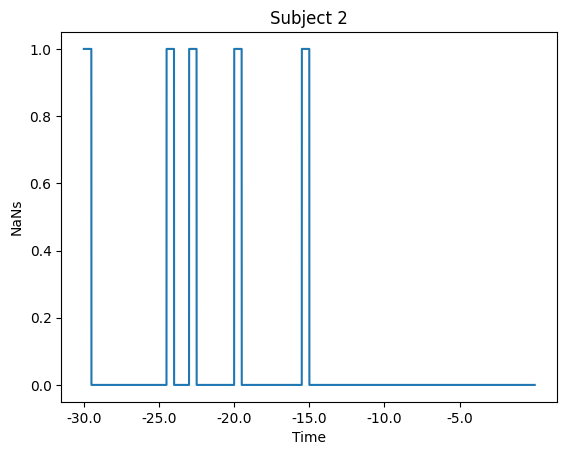

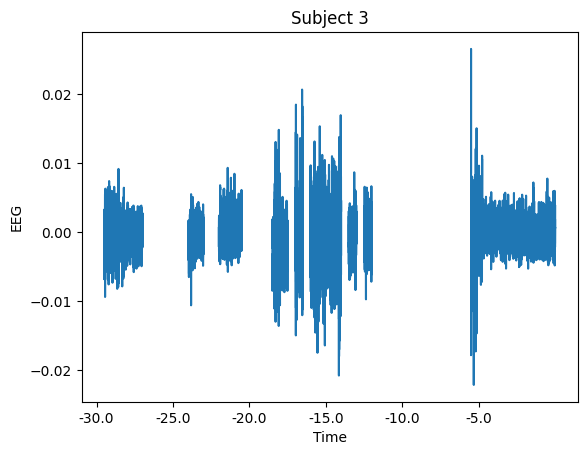

...

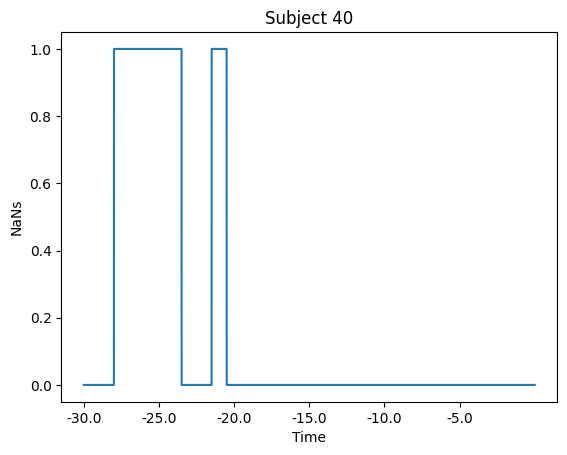

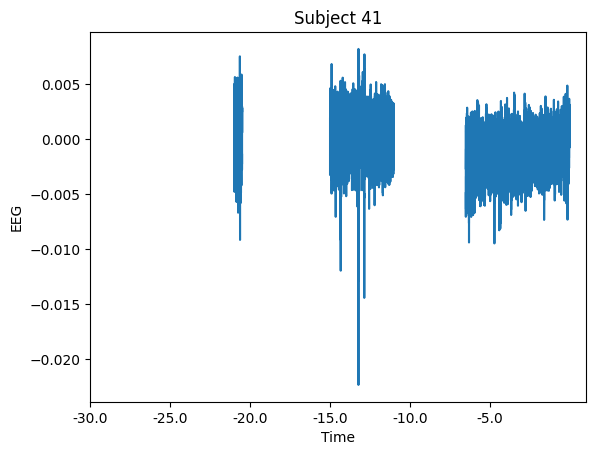

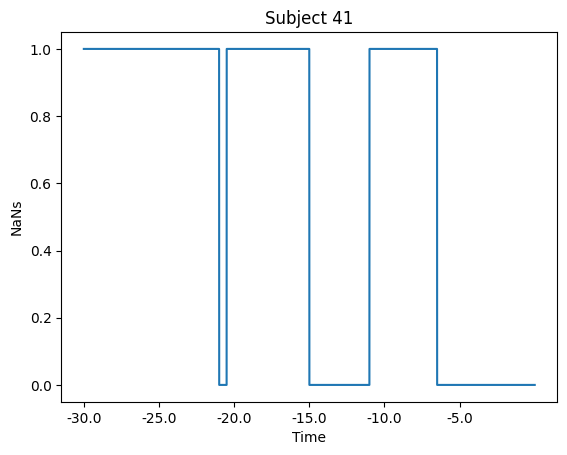

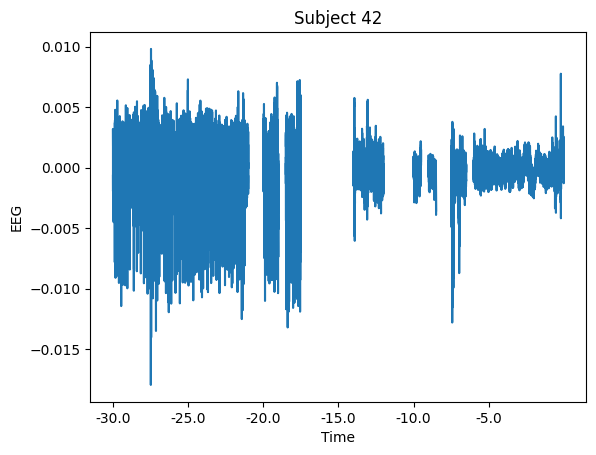

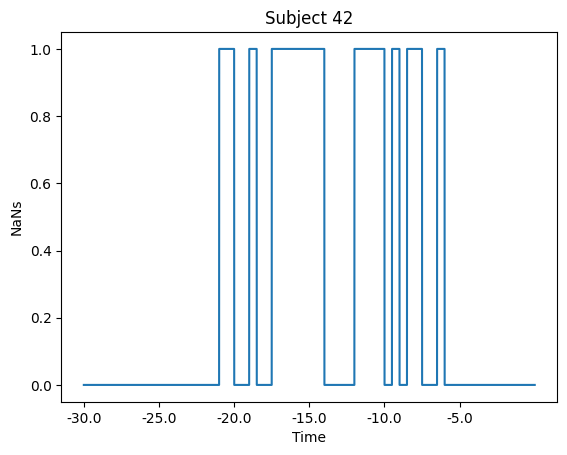

In [24]:
for sbj in sbj_eegs:
    sbj.plot_mean_data()
    

In [ ]:
# Create a list of SbjEEG objects, one for each subject
#sbj_eegs = [SbjEEG(windowed_data[i], labels[i]) for i in range(len(windowed_data))]
#sbj_eegs

In [84]:
# the data has 3 dimensions: subjects, channels and EEG data

import numpy as np

def create_windows(data, window_size, stride):
    # Data shape: (subjects, channels, data points)
    num_subjects, num_channels, num_datapoints = data.shape
    
    # Number of windows will be calculated based on stride length
    num_windows = (num_datapoints - window_size) // stride + 1
    
    # Preallocate arrays for windowed data and labels
    windowed_data = np.zeros((num_subjects, num_windows, num_channels, window_size))
    labels = np.zeros((num_subjects, num_windows))
    
    # For each subject, create windows and corresponding labels

    idx_to_delete = []
    for i in range(num_subjects):
        for j in range(num_windows):
            start = j * stride
            end = start + window_size
            
            windowed_data[i, j] = data[i, :, start:end]

            # if NaNs are present in the window, label as NaN and save the index to delete later
            if np.isnan(windowed_data[i, j]).any():
                labels[i, j] = np.nan
                idx_to_delete.append[i,j]
                continue
            
            # Label is the time to sleep from the end of the window
            # Since 1 data point corresponds to 1/256 seconds, 
            # convert this time to minutes by dividing by 60*256
            labels[i, j] = (num_datapoints - end) / (60 * 256)
            
    return windowed_data, labels

# Define window size and stride length in terms of data points
window_size = 5 * 60 * 256  # 5 minutes
stride = window_size // 10  # Non-overlapping windows

windowed_data, labels = create_windows(data, window_size, stride)

In [85]:
windowed_data.shape

(42, 51, 3, 76800)

In [94]:
labels.shape

(42, 51)

[SbjEEG(data=[[[-1.29476120e-03 -1.65412993e-03 -4.86428794e-04 ...  5.92492871e-04
    -8.20492118e-04 -1.01807822e-03]
   [-1.29476120e-03 -1.65412993e-03 -4.86428794e-04 ...  5.92492871e-04
    -8.20492118e-04 -1.01807822e-03]
   [-1.29476120e-03 -1.65412993e-03 -4.86428794e-04 ...  5.92492871e-04
    -8.20492118e-04 -1.01807822e-03]]
 
  [[-9.59768118e-04 -1.71920706e-04 -5.27657755e-05 ... -3.63077255e-04
    -1.01931526e-04  4.13975544e-05]
   [-9.59768118e-04 -1.71920706e-04 -5.27657755e-05 ... -3.63077255e-04
    -1.01931526e-04  4.13975544e-05]
   [-9.59768118e-04 -1.71920706e-04 -5.27657755e-05 ... -3.63077255e-04
    -1.01931526e-04  4.13975544e-05]]
 
  [[-3.35238355e-03 -3.40074431e-03 -2.98253636e-03 ...  1.13449755e-04
    -4.98485304e-05 -4.80018389e-04]
   [-3.35238355e-03 -3.40074431e-03 -2.98253636e-03 ...  1.13449755e-04
    -4.98485304e-05 -4.80018389e-04]
   [-3.35238355e-03 -3.40074431e-03 -2.98253636e-03 ...  1.13449755e-04
    -4.98485304e-05 -4.80018389e-04]]


In [110]:
# Look at the first subject 
sbj_eegs[0].data.shape

(51, 3, 76800)

In [111]:
# Count the number of windows across all subjects
num_windows = 0
for sbj in sbj_eegs:
    num_windows += len(sbj)

num_windows



2142

In [108]:

# For each subject in the list, go through each window and deletes the windows that have NaN values for more than 50% of the 
for sbj in sbj_eegs:
    to_delete = []
    for i in range(len(sbj.data)):

        # if there are any NaN values in the window
        #if np.isnan(sbj.data[i]).any():
             # mark the window for deletion
            #to_delete.append(i)
        if np.isnan(sbj.data[i]).sum() > 3 * 0.5 * len(sbj.data[i]):
            to_delete.append(i)

    # delete the windows with NaN values
    sbj.data = np.delete(sbj.data, to_delete, axis=0)
    sbj.labels = np.delete(sbj.labels, to_delete, axis=0)

# Count the number of windows across all subjects
num_windows = 0

for sbj in sbj_eegs:
    num_windows += len(sbj)

num_windows

386

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_32434/865162288.py:4: RuntimeWarning: Mean of empty slice
  sbj.data[i] = np.nanmean(sbj.data[i], axis=0)


TypeError: Invalid shape (51, 3, 76800) for image data

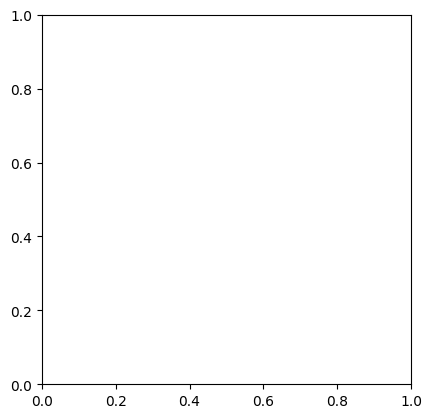

In [120]:
# For each subject, for each window mean it across the channels (omit nan values)
for sbj in sbj_eegs:
    for i in range(len(sbj.data)):
        sbj.data[i] = np.nanmean(sbj.data[i], axis=0)

# Count the number of windows across all subjects
num_windows = 0

for sbj in sbj_eegs:
    num_windows += len(sbj)
num_windows

# Plot the data for all subjects and all windows, showing NaN values as white
for sbj in sbj_eegs:
    plt.figure()
    plt.imshow(sbj.data, cmap='gray')
    plt.show()







In [116]:
# For each subject, for each window, if there are any NaN values, replace them with the mean of the window
for sbj in sbj_eegs:
    for i in range(len(sbj.data)):
        sbj.data[i] = np.nan_to_num(sbj.data[i], nan=np.nanmean(sbj.data[i]))

        

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_32434/886489904.py:4: RuntimeWarning: Mean of empty slice
  sbj.data[i] = np.nan_to_num(sbj.data[i], nan=np.nanmean(sbj.data[i]))


In [117]:
# Count the number of windows with NaNs across all subjects
num_windows = 0
for sbj in sbj_eegs:
    num_windows += np.isnan(sbj.data).any().sum()
num_windows

16

In [62]:
windowed_data_clean.shape

(1, 51, 3, 76800)

In [76]:
# Create a mean across the channels dimension (axis=2) but keep the other dimensions so the shape should be ()

windowed_data_mean = windowed_data.mean(axis=2, keepdims=True)

# take away the redundant dimension

windowed_data_mean = windowed_data_mean.squeeze()


In [77]:
windowed_data_mean.shape

(42, 51, 76800)

In [91]:
idx_nans = np.isnan(windowed_data).any(axis=(1,2,3))
idx_nans

array([ True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

In [92]:
# For each subject, delete the windows  which have more than 50% of NaNs

def delete_nan_windows(windowed_data, labels, threshold=0.5):

    # Find indices where NaNs are in the data
    idx_nans = np.isnan(windowed_data).any(axis=(1,2,3))

    print(idx_nans.shape)

    # Find indices where there are more than 50% NaNs
    idx_delete = np.sum(idx_nans, axis=0) > threshold * windowed_data.shape[1]

    # Remove those indices from the data
    windowed_data_clean = windowed_data[~idx_delete]
    labels_clean = labels[~idx_delete]

    return windowed_data_clean, labels_clean

windowed_data_clean, labels_clean = delete_nan_windows(windowed_data, labels)




(42,)


In [93]:
windowed_data_clean.shape

(0, 42, 51, 3, 76800)

In [81]:
# Delete the rows with NaNs

windowed_data_mean_clean = windowed_data_mean[~idx_nans]

windowed_data_mean_clean.shape





(1, 51, 76800)

In [58]:
#  Iterate through each subject and delete the windows that contain NaNs

for i in range(windowed_data.shape[0]):

    # Find the indices of the windows that contain NaNs
    nan_indices = np.where(np.isnan(windowed_data[i, :, :, :])) 

    # Delete the windows that contain NaNs
    windowed_data = np.delete(windowed_data, nan_indices, axis=1)
    labels = np.delete(labels, nan_indices, axis=1)




IndexError: index 23040 is out of bounds for axis 0 with size 51

In [53]:
windowed_data.shape

(42, 51, 3, 76800)

In [54]:
# Check that there are no NaNs in the data
np.isnan(windowed_data).sum()


46540800

In [18]:
# Split data into train and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(windowed_data, labels, test_size=0.2, random_state=42)

X_train.shape


(33, 26, 3, 76800)

In [21]:
!pip install tensorflow
!pip install keras

  Using cached tensorflow-2.13.0rc2-cp311-cp311-macosx_12_0_arm64.whl (2.0 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.3/189.3 MB 3.2 MB/s eta 0:00:0000:0100:02
  Using cached absl_py-1.4.0-py3-none-any.whl (126 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached gast-0.4.0-py3-none-any.whl (9.8 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 3.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.3/24.3 MB 1.9 MB/s eta 0:00:0000:0100:01
  Using cached opt_einsum-3.3.0-py3-none-any.whl (65 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.3/400.3 kB 3.0 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 2.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 1.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 1.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━

In [77]:
sbj_eegs[0].epoched_data.shape

(168944, 3, 5)

In [72]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, LSTM, Dense, Flatten
from tensorflow.keras.layers import TimeDistributed, BatchNormalization, Activation

def create_model(input_shape):
    model = Sequential()

    # Apply Conv1D to each window separately
    model.add(TimeDistributed(Conv1D(filters=64, kernel_size=3, padding='same'), input_shape=input_shape))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(Activation('relu')))

    # Flatten the output of each window
    model.add(TimeDistributed(Flatten()))

    # Add LSTM layer
    model.add(LSTM(100, activation='relu'))

    # Add output layer
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mse')

    return model

# Get the shape of the windowed data for the first training subject
# This will be the input shape for the model
input_shape = (sbj_eegs[0].epoched_data.shape[1], sbj_eegs[0].epoched_data.shape[2])

# Create the model
model = create_model(input_shape)

ValueError: Exception encountered when calling layer "time_distributed" (type TimeDistributed).

Input 0 of layer "conv1d" is incompatible with the layer: expected min_ndim=3, found ndim=2. Full shape received: (None, 5)

Call arguments received by layer "time_distributed" (type TimeDistributed):
  • inputs=tf.Tensor(shape=(None, 3, 5), dtype=float32)
  • training=None
  • mask=None

In [ ]:
# Split the subjects into training and test sets
num_subjects = len(sbj_eegs)
num_train_subjects = int(0.8 * num_subjects)
train_sbj_eegs = sbj_eegs[:num_train_subjects]
test_sbj_eegs = sbj_eegs[num_train_subjects:]

# Organize the data
X_train = np.concatenate([sbj.epoched_data for sbj in train_sbj_eegs])
y_train = np.concatenate([sbj.labels for sbj in train_sbj_eegs])
X_test = np.concatenate([sbj.epoched_data for sbj in test_sbj_eegs])
y_test = np.concatenate([sbj.labels for sbj in test_sbj_eegs])

# Normalize data (if needed)
# X_train = (X_train - np.min(X_train)) / (np.max(X_train) - np.min(X_train))
# X_test = (X_test - np.min(X_test)) / (np.max(X_test) - np.min(X_test))

# Convert data to TensorFlow Dataset for easy batching and shuffling
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).shuffle(len(X_train)).batch(32)
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(32)

# Create the model
input_shape = (X_train.shape[1], X_train.shape[2])
model = create_model(input_shape)

# Training loop
epochs = 10
for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")

    # Train the model for one epoch
    for X_batch, y_batch in train_dataset:
        model.train_on_batch(X_batch, y_batch)

    # Evaluate the model on the test data
    test_loss = model.evaluate(test_dataset, verbose=0)

    print(f"Test loss: {test_loss}")

Epoch 1/10
2/2 [==============================] - 6s 149ms/step - loss: nan
Epoch 2/10
2/2 [==============================] - 4s 139ms/step - loss: nan
Epoch 3/10
2/2 [==============================] - 4s 149ms/step - loss: nan
Epoch 4/10
2/2 [==============================] - 4s 200ms/step - loss: nan
Epoch 5/10
2/2 [==============================] - 4s 143ms/step - loss: nan
Epoch 6/10
2/2 [==============================] - 4s 136ms/step - loss: nan
Epoch 7/10
2/2 [==============================] - 4s 131ms/step - loss: nan
Epoch 8/10
2/2 [==============================] - 4s 128ms/step - loss: nan
Epoch 9/10
2/2 [==============================] - 4s 131ms/step - loss: nan
Epoch 10/10
1/1 [==============================] - 0s 220ms/step


ValueError: x and y must have same first dimension, but have shapes (234,) and (9,)

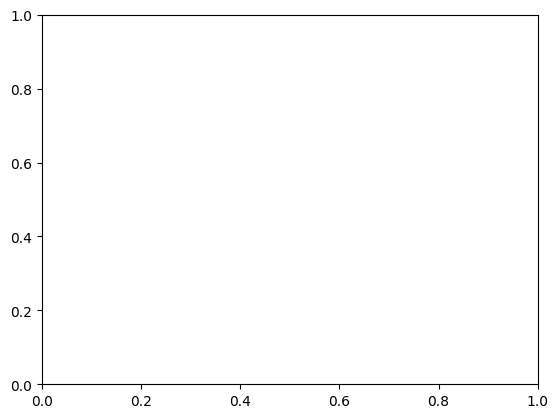

In [28]:
# Train the model 
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Evaluate the model on the test set
model.evaluate(X_test, y_test)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Plot the predictions vs the actual values
plt.plot(y_test.flatten(), y_pred.flatten(), 'o')
plt.xlabel('Actual time to sleep (minutes)')
plt.ylabel('Predicted time to sleep (minutes)')
plt.show()
